In [1]:
import pickle
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from evaluation_util import plot, evaluate_on_dataset, perf_df

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/lightning_utilities/core/imports.py:14: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources
/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/lightning_fabric/__init__.py:40: Deprecated call to `pkg_resources.declare_namespace('lightning_fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/pytorch_lightning/__init__.py:37: Deprecated call to `pkg_resources.declare_namespace('pytorch_lightning')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/r

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
dss_path = '/lustre/scratch/users/yuge.ji/metrics/with_DEGs/'

In [5]:
performances = {}

## simulated

In [6]:
%%time
# with open('metric_runs_simulated2.pkl', 'rb') as file:
#     results = pickle.load(file)
# print(results.keys())
with open(f'{dss_path}/sim_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 20.9 ms, sys: 2.11 s, total: 2.13 s
Wall time: 2.23 s


In [7]:
# get metadata
sim_path = './data/sim_files/sim_files/splatter_sim'
params = pd.read_csv(f'{sim_path}/splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df):
    # annotate
    for col in params.columns:
        df[col] = df['perturbation'].map(dict(zip(params.perturbation, params[col])))
    df = df.dropna()  # dropping fake controls

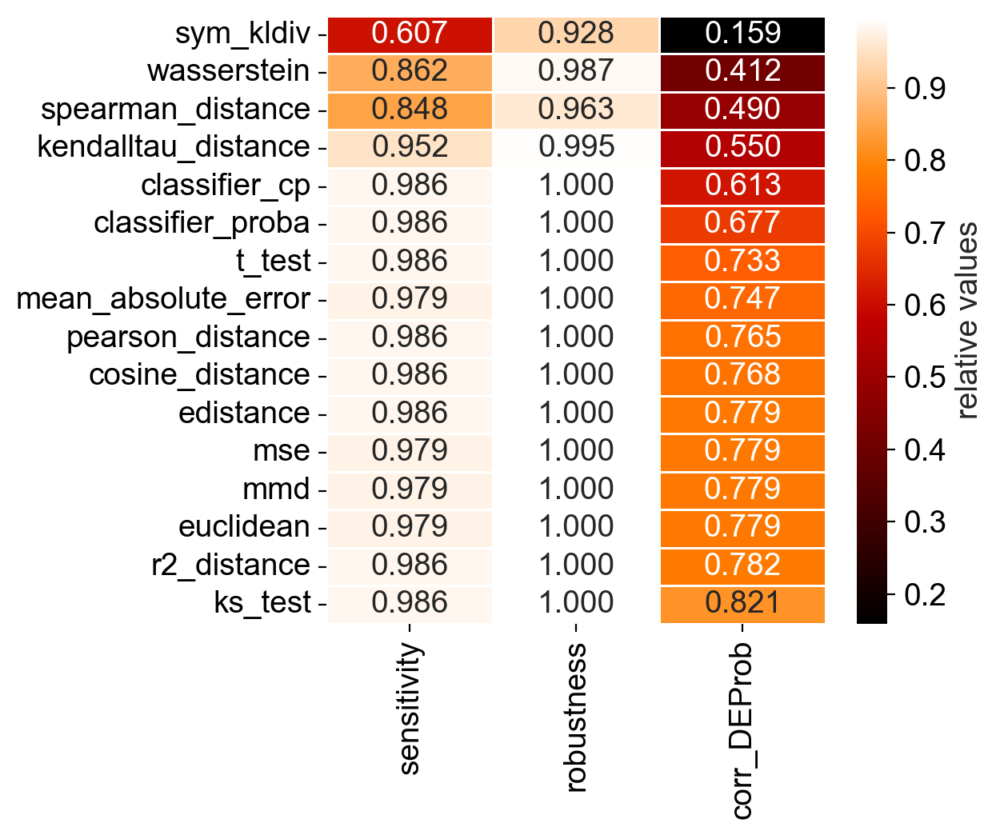

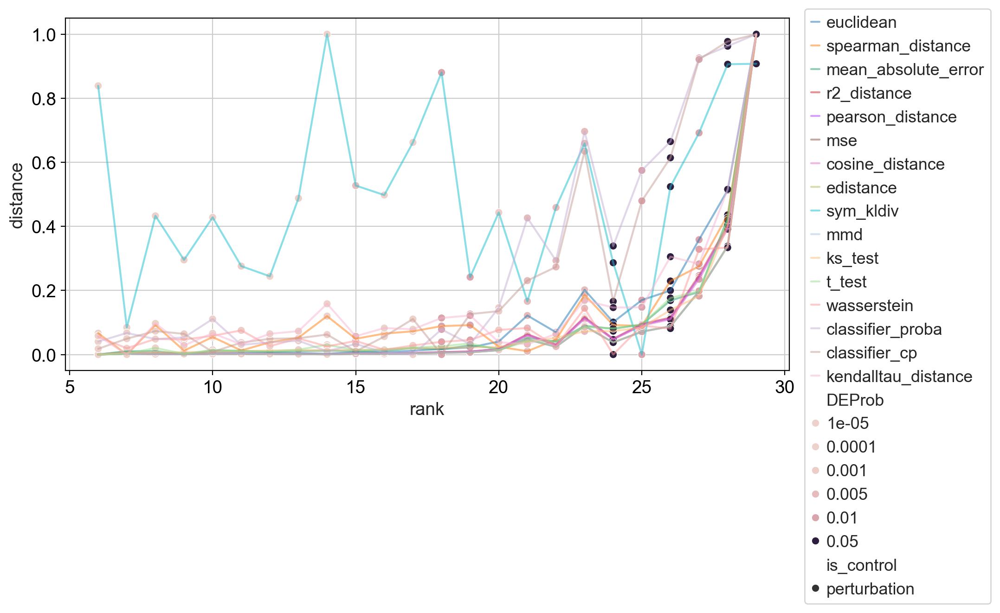

In [8]:
performances['simulated'] = evaluate_on_dataset(results, annotate, 'DEProb', 'ks_test')

## garcia

In [9]:
%%time
with open(f'{dss_path}/garcia_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 23.3 ms, sys: 358 ms, total: 381 ms
Wall time: 612 ms


In [10]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['pcw'] = [float(p) if 'control' not in p else 8.6 for p in df.perturbation]

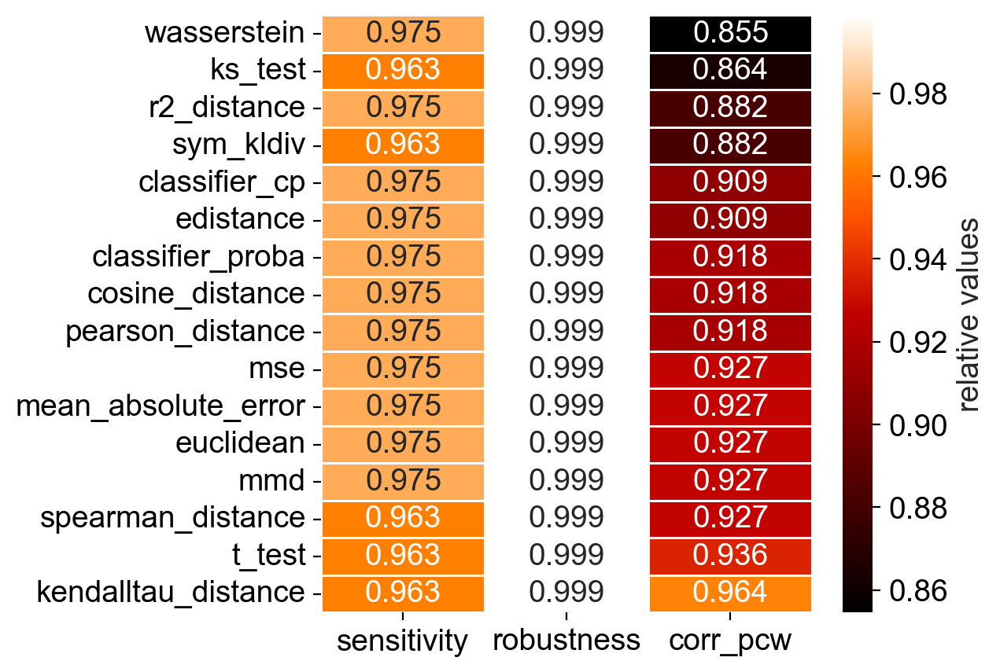

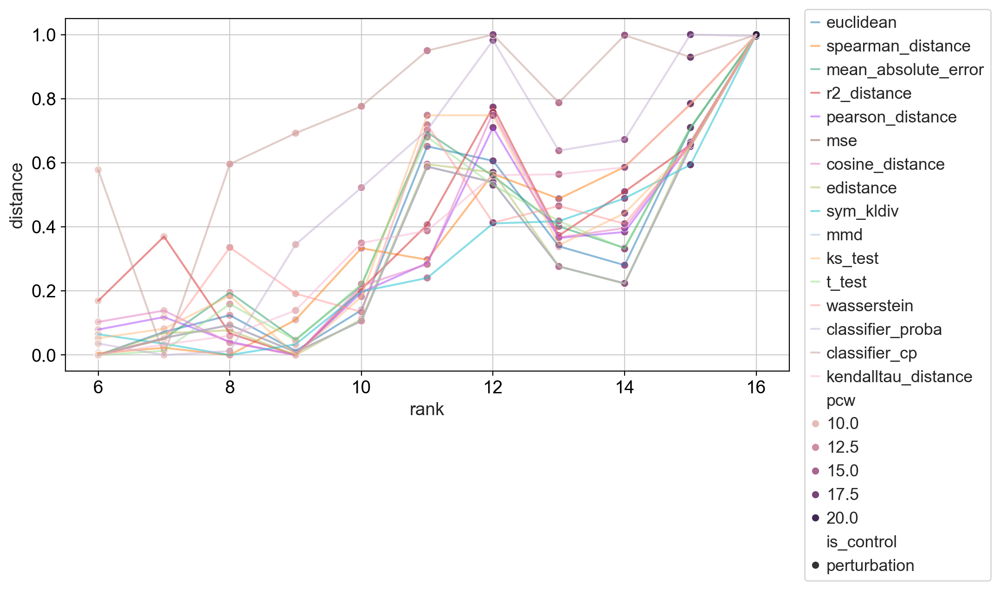

In [11]:
performances['garcia'] = evaluate_on_dataset(results, annotate, 'pcw', 'kendalltau_distance')

## schiebinger

In [12]:
%%time
with open(f'{dss_path}/schiebinger_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 25.8 ms, sys: 1.45 s, total: 1.48 s
Wall time: 1.66 s


In [13]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['day'] = [float(p[1:]) if 'D' in p else 0 for p in df.perturbation]

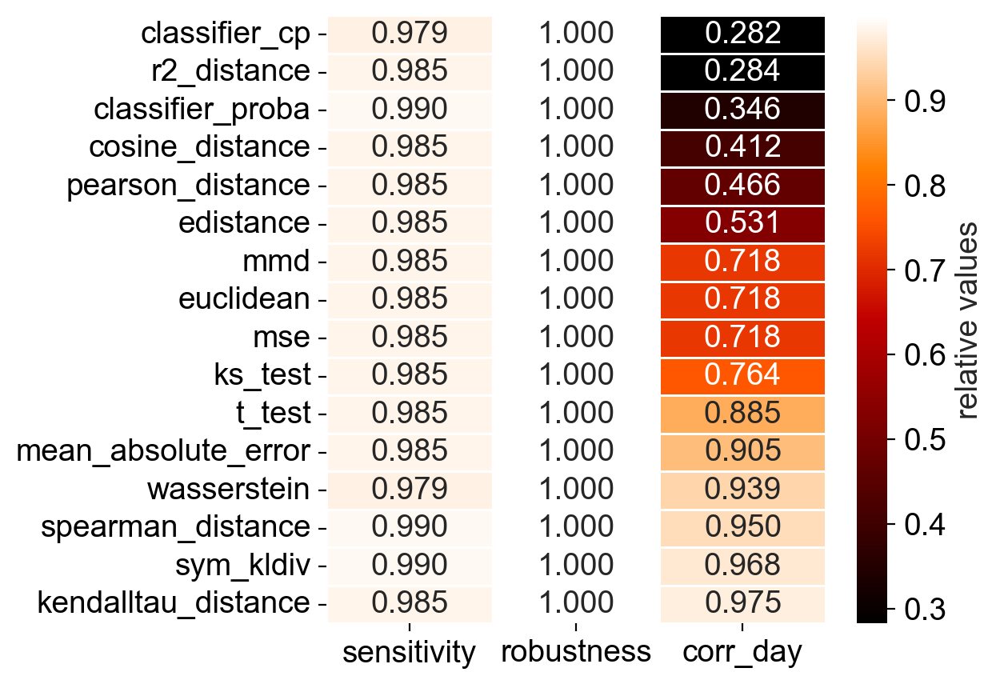

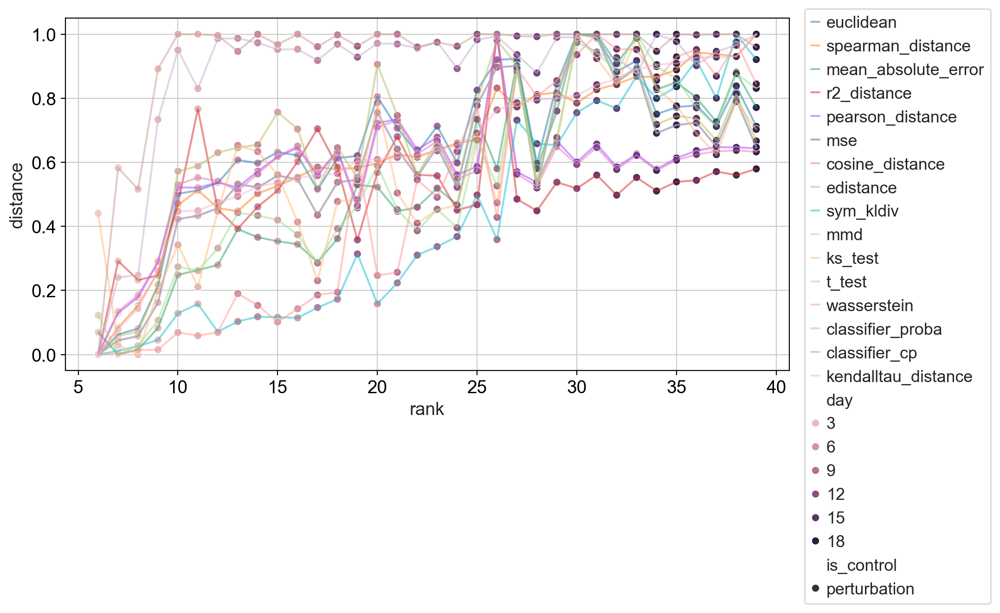

In [14]:
performances['schiebinger'] = evaluate_on_dataset(results, annotate, 'day', 'kendalltau_distance')

## satinha

In [15]:
%%time
with open(f'{dss_path}/satinha_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 33.4 ms, sys: 1.24 s, total: 1.27 s
Wall time: 1.44 s


Don't think we have a source of ground truth in this dataset...

In [16]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = 1

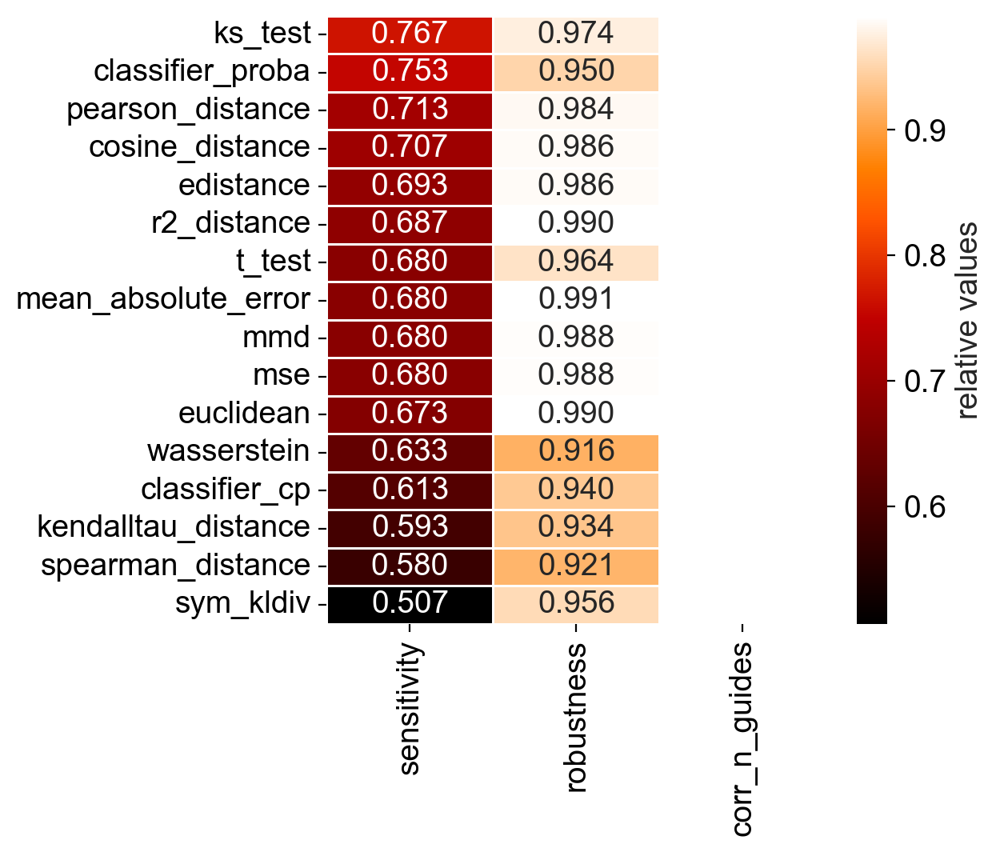

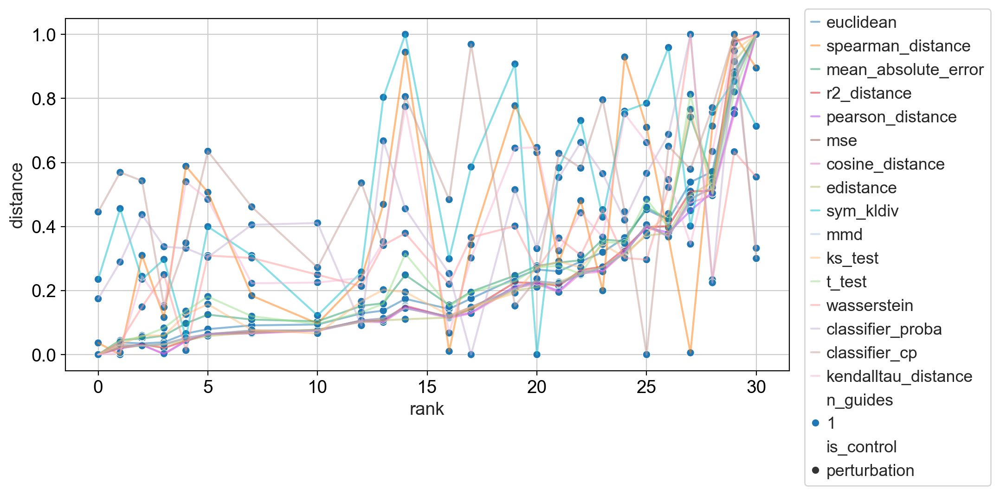

In [17]:
performances['satinha'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## norman

In [18]:
%%time
with open(f'{dss_path}/norman_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 35.6 ms, sys: 6.82 s, total: 6.86 s
Wall time: 7.87 s


In [19]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = [int(s.count('+'))+1 for s in df.perturbation]

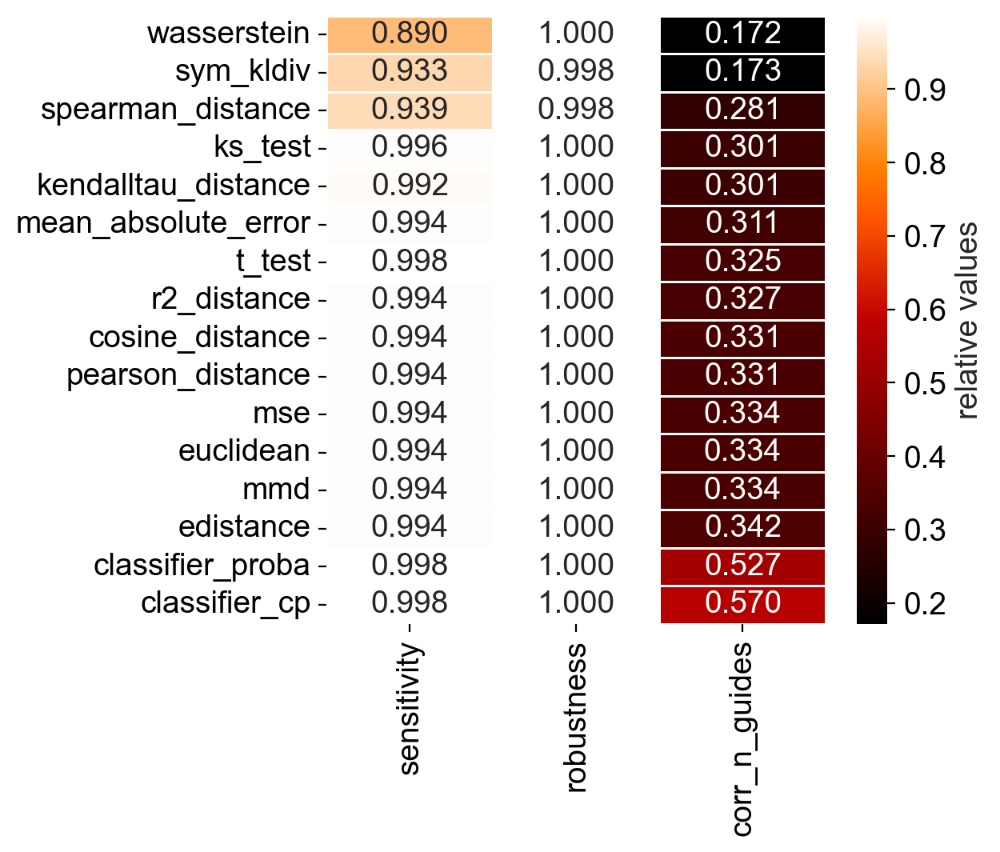

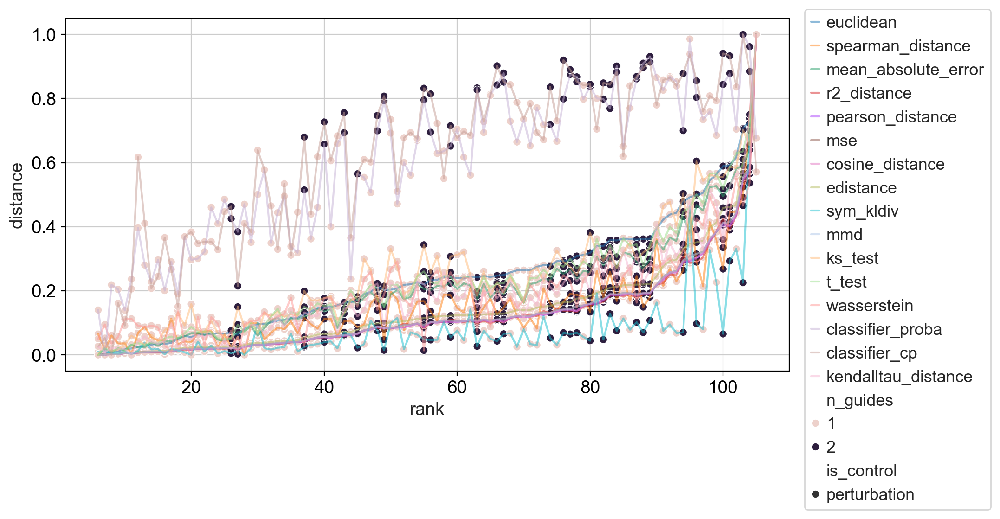

In [20]:
performances['norman'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## sciplex

In [21]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

### MCF7

In [22]:
%%time
with open(f'{dss_path}/spMCF7_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 37.9 ms, sys: 4.24 s, total: 4.28 s
Wall time: 5.26 s


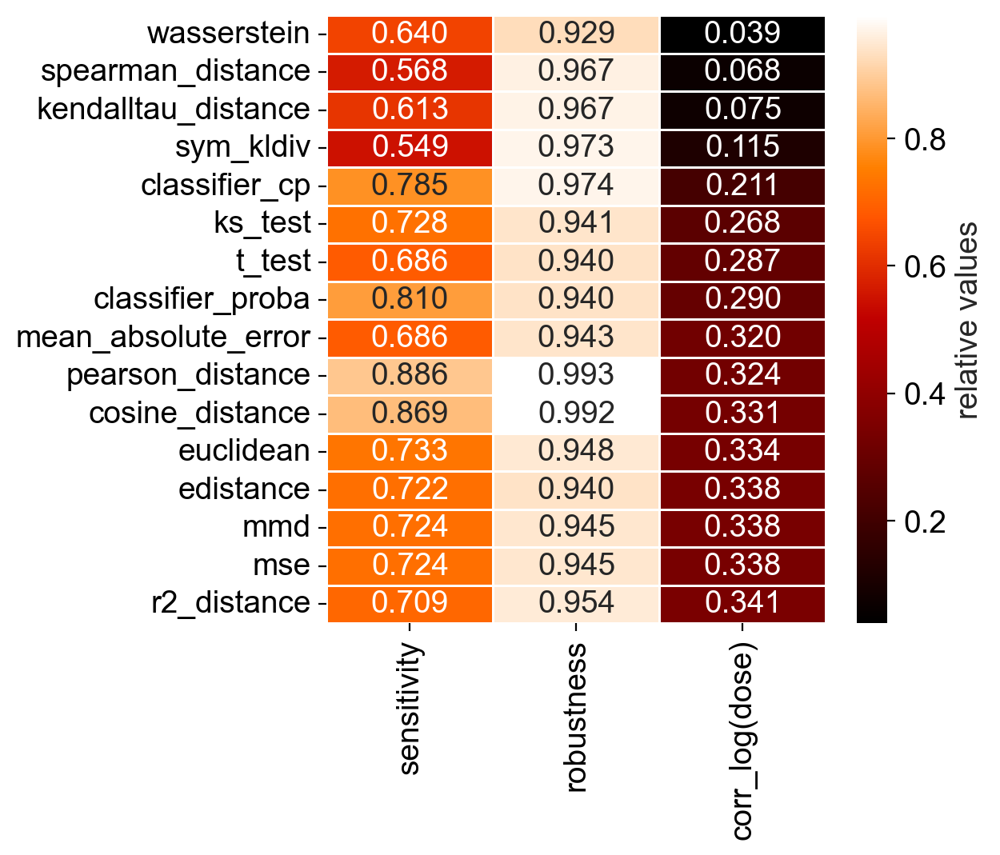

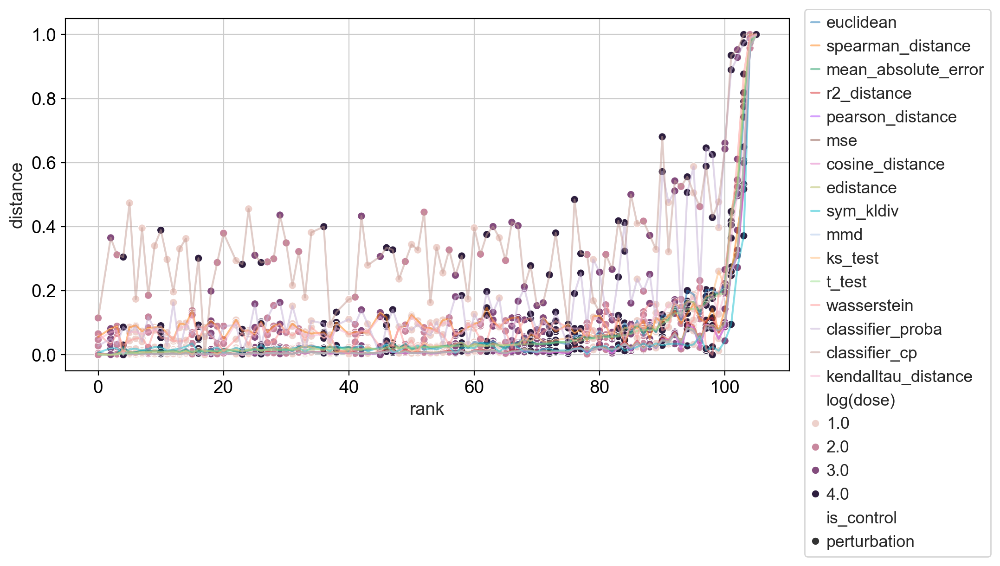

In [23]:
performances['sciplex_MCF7'] = evaluate_on_dataset(results, annotate, 'log(dose)', 't_test')

### A549

In [24]:
%%time
with open(f'{dss_path}/spA549_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 29.6 ms, sys: 1.99 s, total: 2.02 s
Wall time: 2.51 s


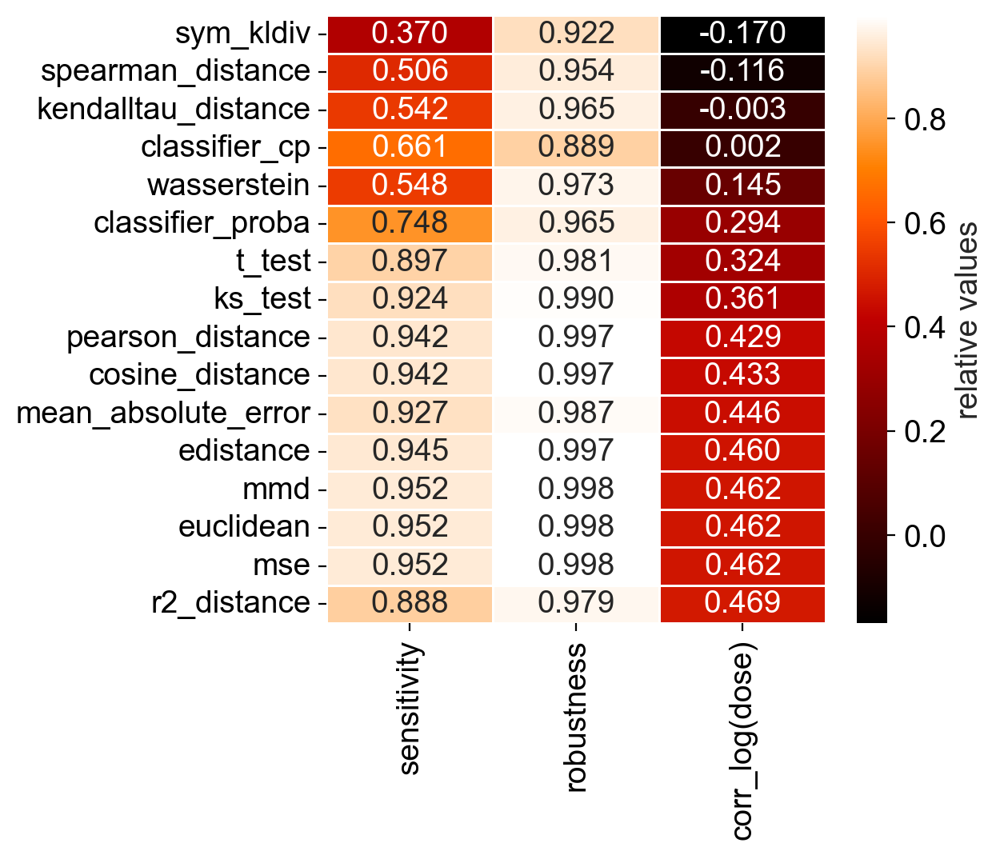

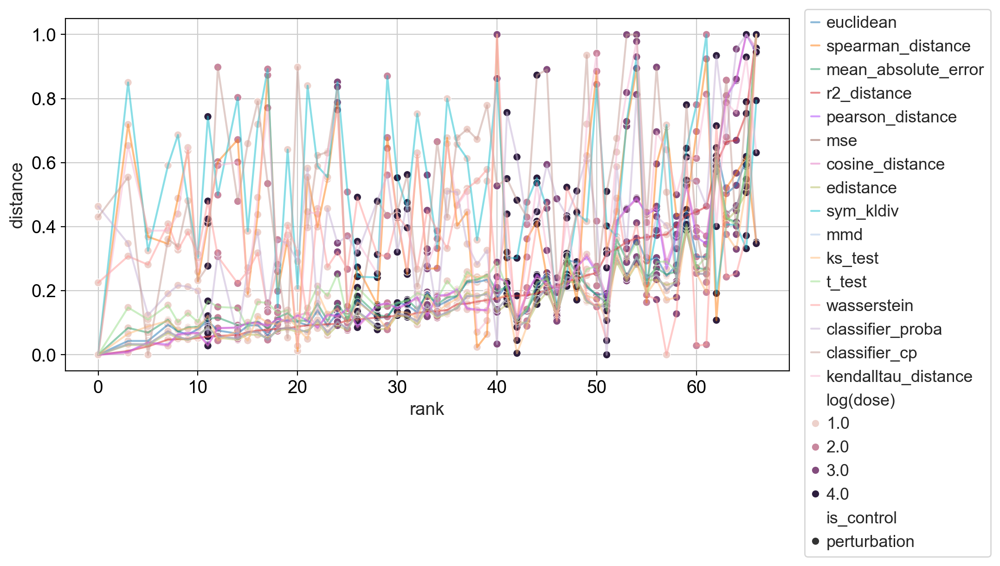

In [25]:
performances['sciplex_A549'] = evaluate_on_dataset(results, annotate, 'log(dose)', 'r2_distance')

### K562

In [26]:
%%time
with open(f'{dss_path}/spK562_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 31.3 ms, sys: 4.57 s, total: 4.6 s
Wall time: 5.2 s


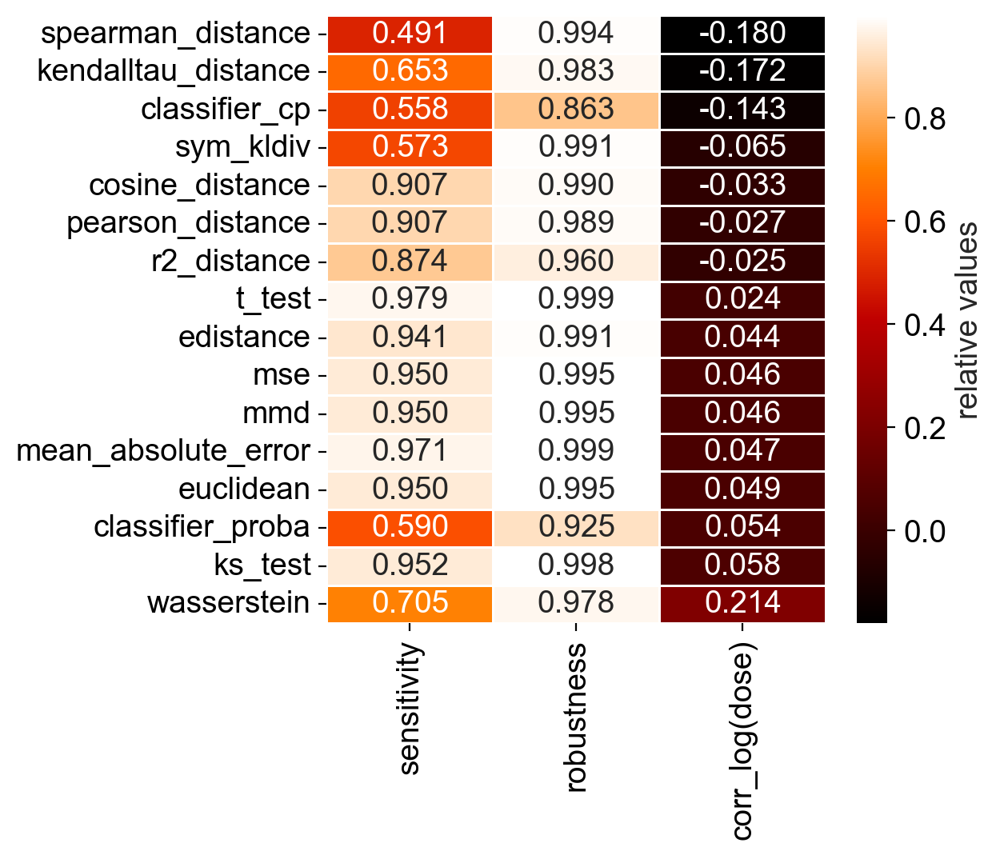

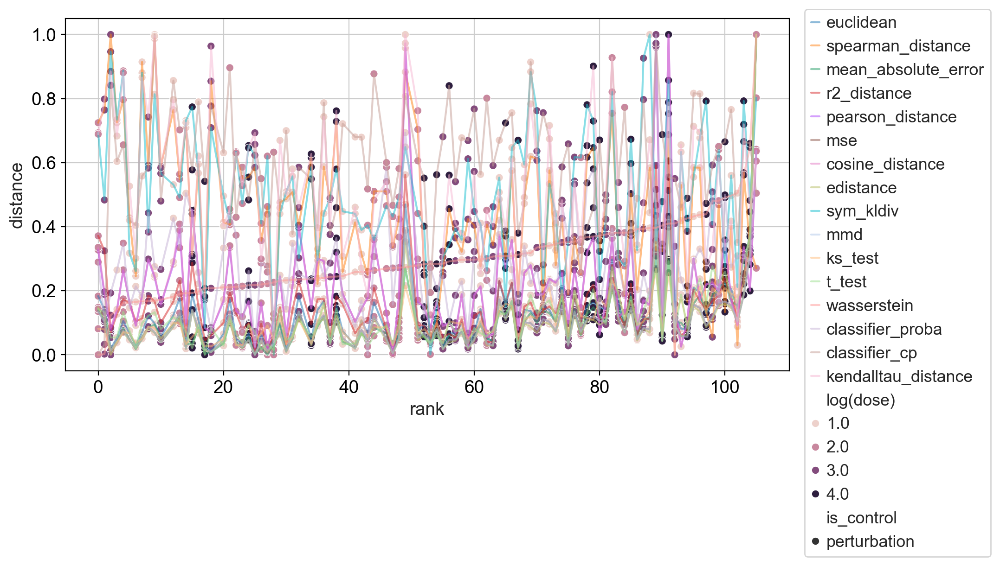

In [27]:
performances['sciplex_K562']  = evaluate_on_dataset(results, annotate, 'log(dose)', 'wasserstein')

## tahoe

In [28]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

### A549

In [29]:
%%time
with open(f'{dss_path}/tahoe_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 59.4 ms, sys: 6.01 s, total: 6.07 s
Wall time: 6.44 s


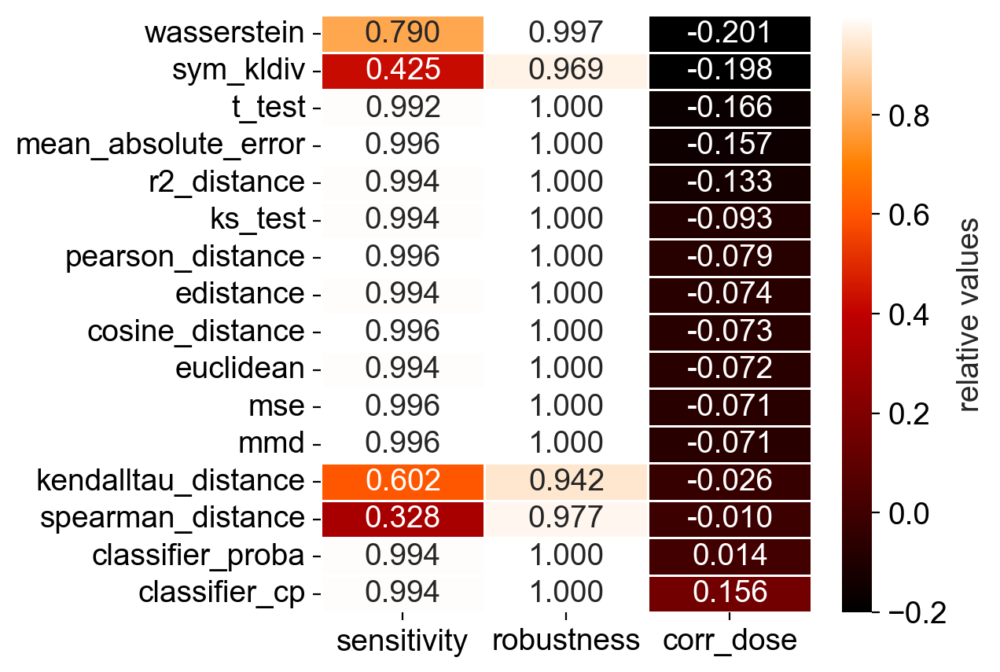

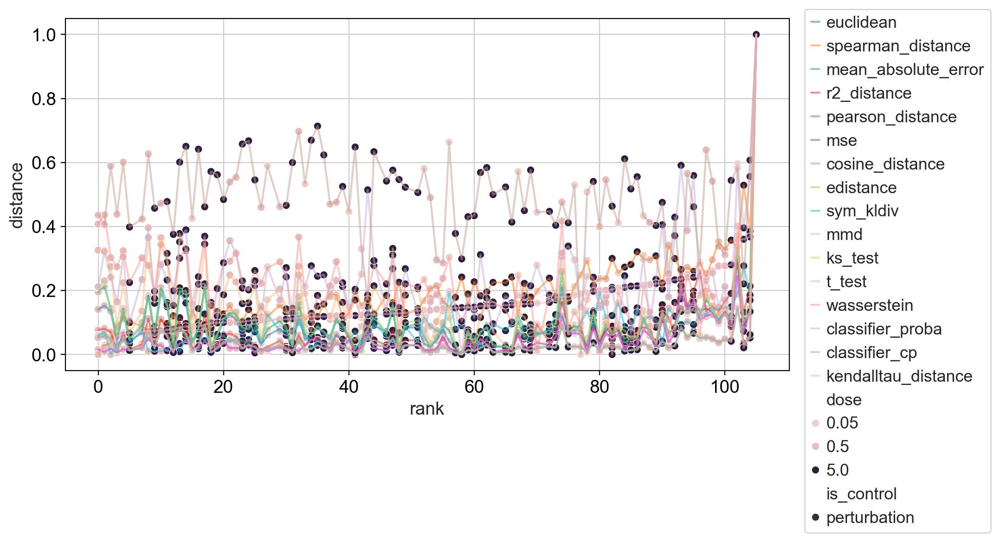

In [30]:
performances['tahoeA549'] = evaluate_on_dataset(results, annotate, 'dose', 'kendalltau_distance')

### HT29

In [31]:
%%time
with open(f'{dss_path}/tahoeHT29_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 52.4 ms, sys: 6.12 s, total: 6.17 s
Wall time: 6.96 s


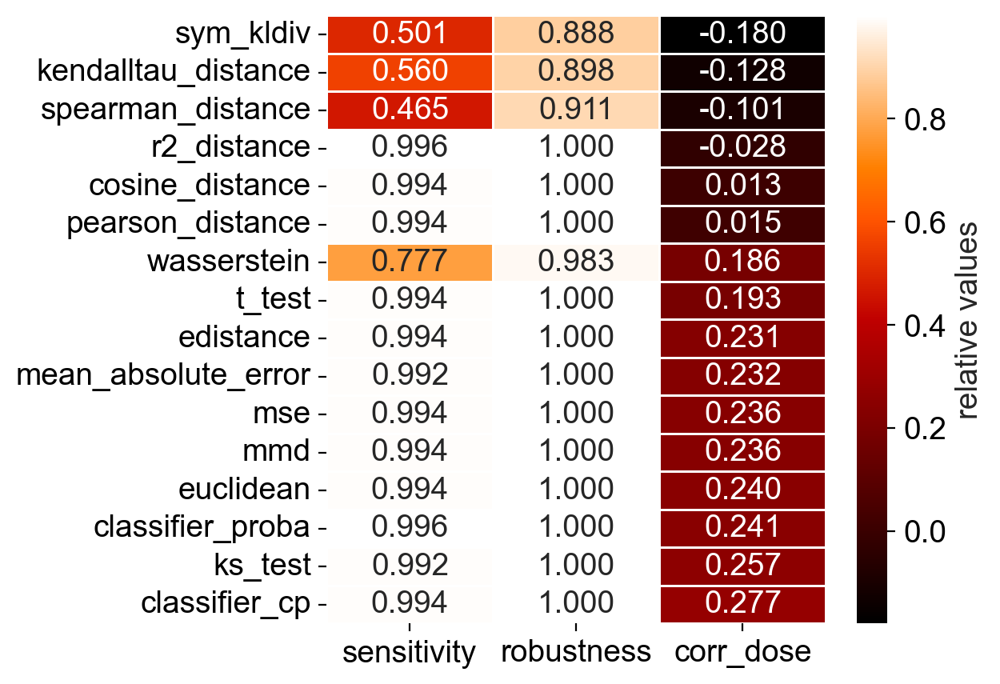

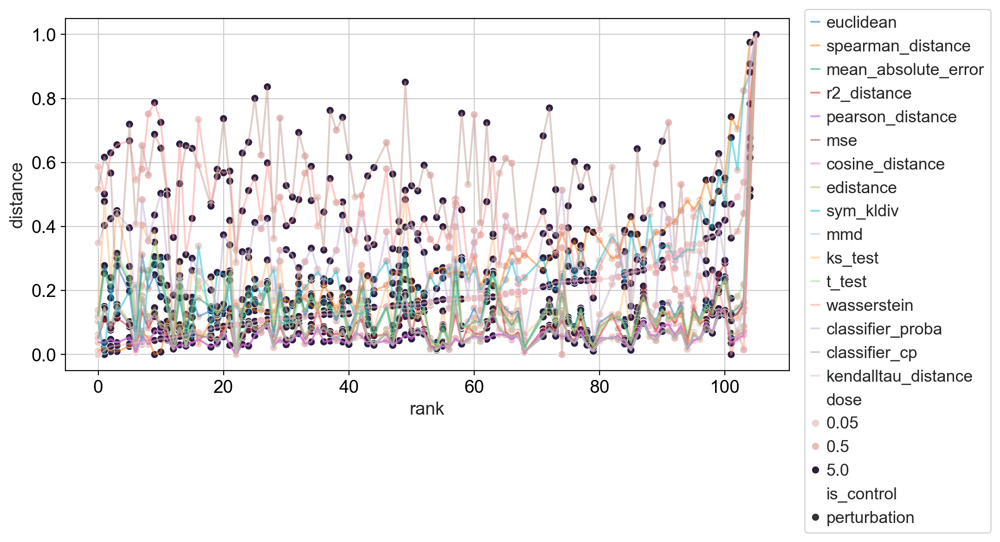

In [32]:
performances['tahoeHT29'] = evaluate_on_dataset(results, annotate, 'dose', 'kendalltau_distance')

### BT474

In [33]:
%%time
with open(f'{dss_path}/tahoeBT474_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 30.9 ms, sys: 444 ms, total: 475 ms
Wall time: 684 ms


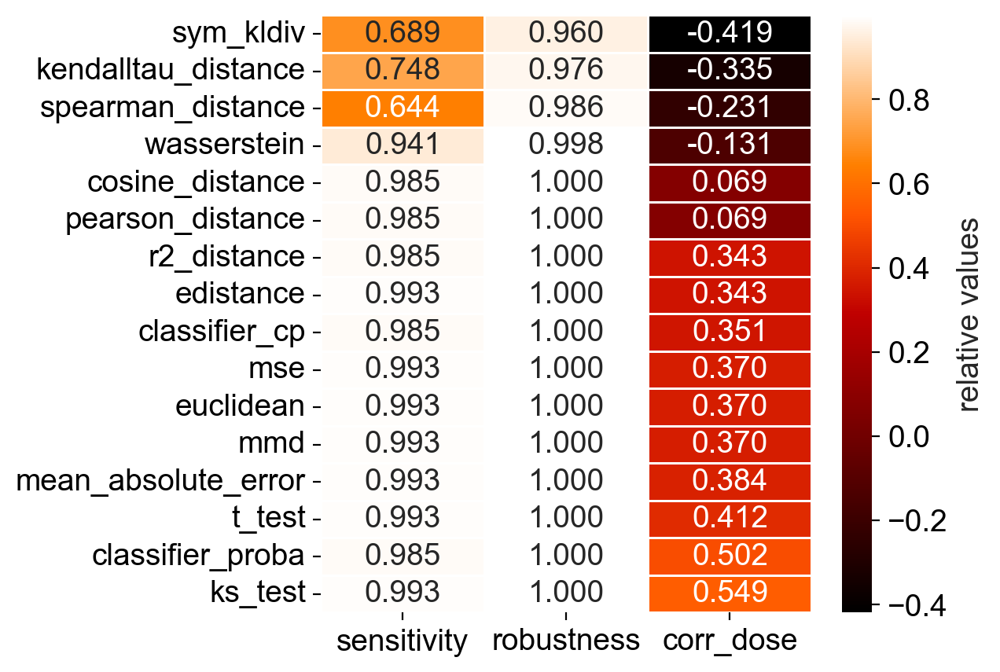

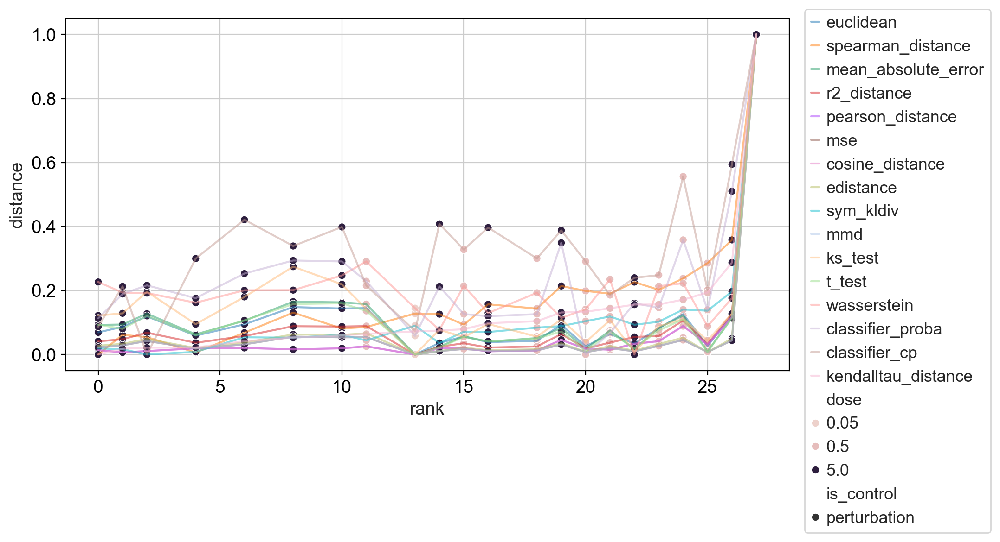

In [34]:
performances['tahoeBT474'] = evaluate_on_dataset(results, annotate, 'dose', 'kendalltau_distance')

## mcfarland

In [35]:
%%time
with open(f'{dss_path}/mcfarland_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 15.1 ms, sys: 45.3 ms, total: 60.4 ms
Wall time: 146 ms


In [36]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['time'] = [0 if 'control' in p else p.split('_')[1] for p in df.perturbation]

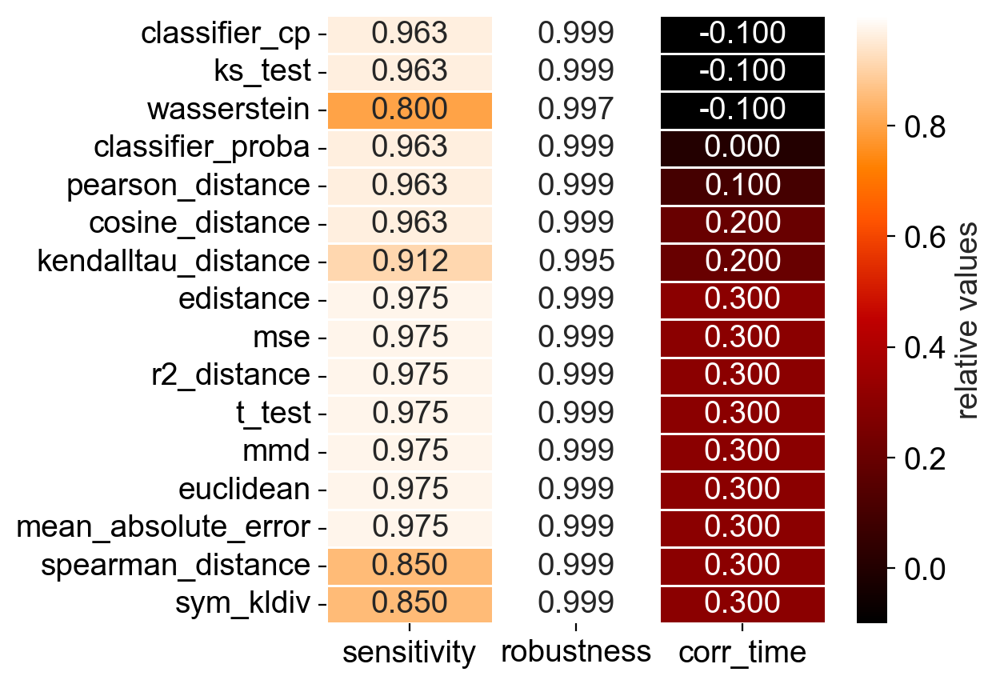

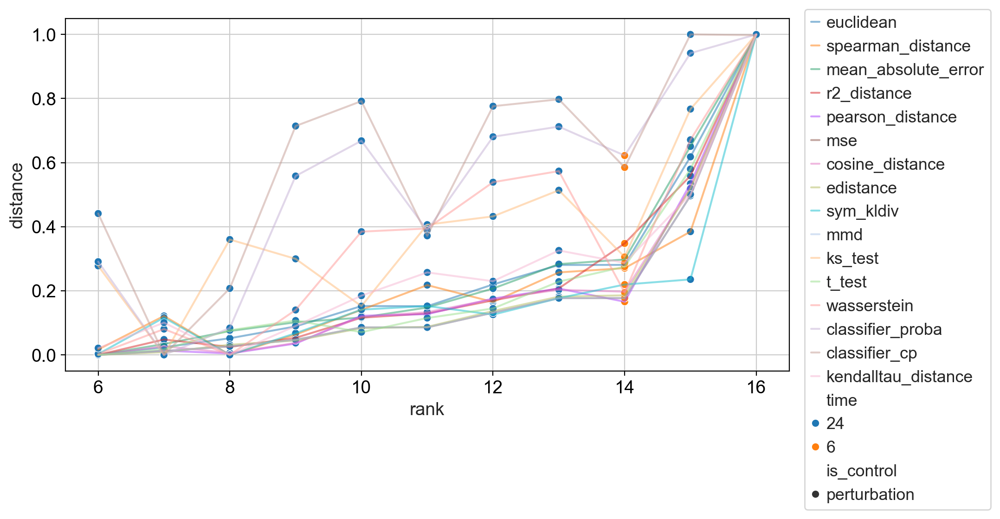

In [37]:
performances['mcfarland'] = evaluate_on_dataset(results, annotate, 'time', 'mean_absolute_error')

## summary

In [38]:
dfs = []
for k, df in performances.items():
    sdf = df.add_suffix(f'_{k}')
    dfs.append(sdf)

In [39]:
df = pd.concat(dfs, axis=1)

Drop any columns that are completely empty because evaluation wasn't possible.

In [40]:
df = df.dropna(axis=1, how='all')

Rename the distance metrics for consistency for publication.

In [41]:
df.index = [' '.join(x.split('_')) for x in df.index]
df = df.rename({
    'euclidean':'Euclidean',
    'mse':'MSE',
    'mmd':'MMD',
    'edistance':'E-distance',
    'pearson distance': 'Pearson',
    't test': 'T-test',
    'r2 distance': 'R2',
    'ks test': 'KS statistic',
    'kendalltau distance': 'Kendall tau distance',
    'spearman distance': 'Spearman',
    'classifier cp': 'classifier class projection',
    'wasserstein':'Wasserstein',
    'sym kldiv':'symmetric KL div.'
})

Many of the plots will use scaled values. Also calculate the final ranking using the avg.

In [42]:
ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
ndf.mean(axis=1)

Euclidean                      0.826980
MSE                            0.824510
MMD                            0.824510
mean absolute error            0.815009
E-distance                     0.807404
cosine distance                0.798763
Pearson                        0.794948
T-test                         0.761639
classifier proba               0.749980
R2                             0.749691
KS statistic                   0.743386
classifier class projection    0.664069
Wasserstein                    0.499698
Kendall tau distance           0.430174
Spearman                       0.371143
symmetric KL div.              0.267920
dtype: float64

Standardize the order of the dataframe and save.

In [43]:
df = df.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
df.to_csv('results_table.csv')

## Plot final table

In [44]:
sc.set_figure_params(dpi=100, frameon=False, facecolor=None, transparent=True, ipython_format='svg', vector_friendly=False)
plt.rcParams['svg.fonttype'] = 'none'

In [45]:
df = pd.read_csv('results_table.csv', index_col=0)
ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]

In [49]:
types = {
    'E-distance':'Ia',
    'Euclidean':'Ia',
    'KS statistic':'Ia',
    'Kendall tau distance':'III',
    'MMD':'Ia',
    'MSE':'Ia',
    'Pearson':'II',
    'R2':'II',
    'Spearman':'III',
    'T-test':'Ib',
    'Wasserstein':'III',
    'classifier class projection':'-',
    'classifier proba':'-',
    'cosine distance':'II',
    'mean absolute error':'Ib',
    'symmetric KL div.':'III',
}

type_to_rank = {
    'Ia': 1,
    'Ib': 2,
    'II': 3,
    'III': 4,
}

color_dict = {
    'garcia':'orange',
    'schiebinger':'salmon',
    'satinha':'yellowgreen',
    'norman':'darkgreen',
    'MCF7':'lightblue',
    'A549':'steelblue',
    'K562':'blue',
    'tahoeA549':'lavender',
    'tahoeBT474':'mediumorchid',
    'tahoeHT29':'purple',
    'mcfarland':'darkblue',
    'simulated':'grey'
}

trio = ['indianred', 'darkseagreen', 'thistle']
cmap = 'bone'
bar_color = 'lightslategrey'

def xtick_off(ax):
    ax.set_xticklabels([])
    ax.set_xticks([])

def ytick_off(ax):
    ax.set_yticklabels([])
    ax.set_yticks([])
    
def add_type(df):
    df['type'] = df.index.map(types)
    return df

def plt_bar(df, title=None, cmap='twilight'):
    plt.figure(facecolor='none')
    sns.barplot(x=df.index, y=0, hue="type", data=df, palette=cmap, dodge=False)
    plt.gca().axis('off')
    plt.grid(None)
    plt.title(title)

<Figure size 2400x600 with 0 Axes>

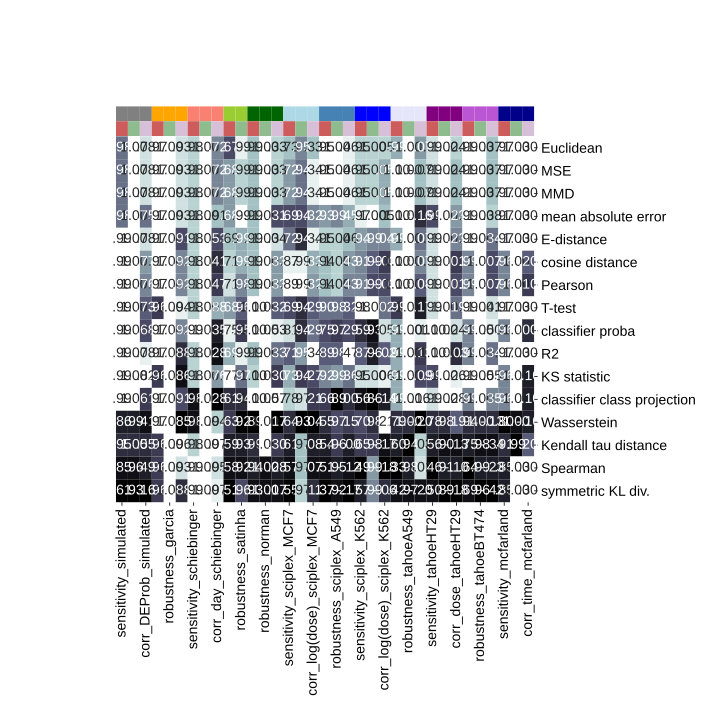

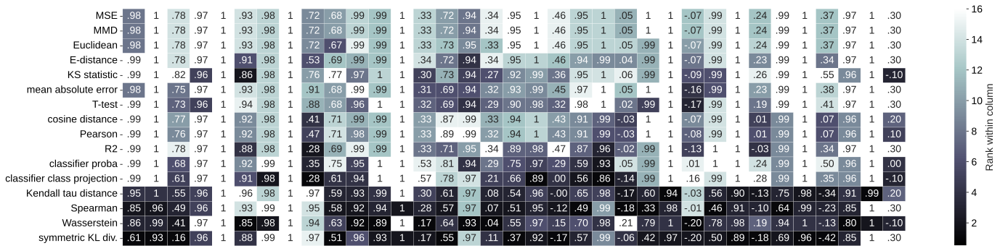

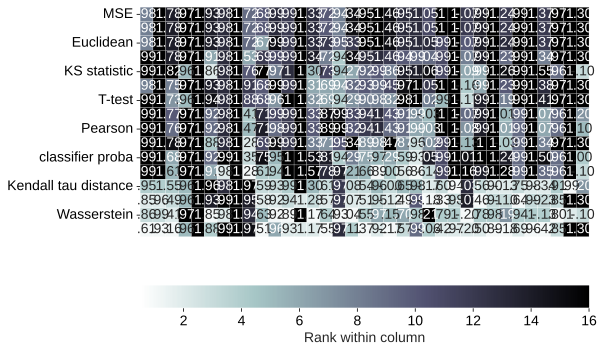

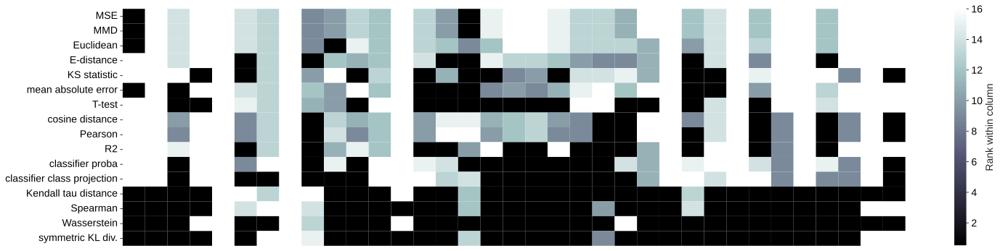

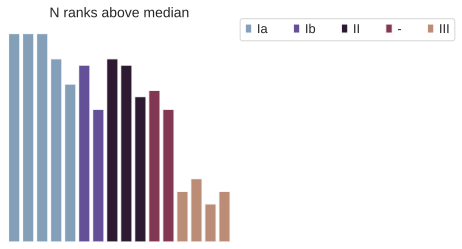

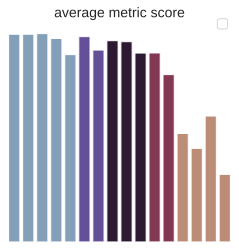

In [51]:
main_plot_df = df.copy()
main_plot_df = main_plot_df.fillna(0)

plt.figure(figsize=(24, 6))
# just for the col color
col_color_dataset = [color_dict[c.split('_')[-1]] for c in df.columns]
col_color_task = trio*3 + trio[:2] + trio*8
sns.clustermap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".")),
    cmap=cmap, fmt = '', cbar_kws={'label': 'Rank within column'},
    row_cluster=False, col_cluster=False, col_colors=[col_color_dataset, col_color_task],
    cbar_pos=None
)
plt.savefig('./figures/mainfig_labelbar.svg')

# processing
main_plot_df.columns = ['_'.join(c.split('_')[:2]) for c in main_plot_df.columns]
main_plot_df = main_plot_df.rename(columns={'rank_mean':'CRP', 'rank_var*100':'robustness'})
halfway = 8
rank_df = main_plot_df.round(3).rank(method='max').clip(lower=halfway)

order = ['MSE', 'MMD', 'Euclidean', 'E-distance', 'KS statistic',  # type I
    'mean absolute error', 'T-test',  # Ib
    'cosine distance', 'Pearson', 'R2',  # II
    'classifier proba', 'classifier class projection',  # classification
    'Kendall tau distance', 'Spearman', 'Wasserstein', 'symmetric KL div.',   # III
]

# getting order automatically
# bar_df = add_type(pd.DataFrame((rank_df > 8).sum(axis=1)))
# bar_df['rank'] = bar_df.type.map(type_to_rank)
# order = bar_df.sort_values(by='rank').index

main_plot_df = main_plot_df.loc[order]
rank_df = rank_df.loc[order]

# the actual plot
plt.figure(figsize=(24, 6))
ax = sns.heatmap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1")),
    cmap=cmap, linewidths=.2, fmt = '',
    cbar_kws={'label': 'Rank within column'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.savefig('./figures/mainfig_table.svg')
plt.show()

# just for the colorbar
plt.figure(figsize=(8, 6))
ax = sns.heatmap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1")),
    cmap=f'{cmap}_r', linewidths=.2, fmt = '',
    cbar_kws={'label': 'Rank within column', 'orientation': 'horizontal', 'location': 'bottom'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.savefig('./figures/mainfig_colorbar.svg')
plt.show()

# for the plot showing that MSE performs above average in all datasets
plt.figure(figsize=(24, 6))
ax = sns.heatmap(
    rank_df.replace(halfway, 0),
    cmap=cmap, cbar_kws={'label': 'Rank within column'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.savefig('./figures/mainfig_table_numberless.svg')
plt.show()

# pairs with the one without numbers
plt_bar(add_type(pd.DataFrame((rank_df > 8).sum(axis=1)).loc[order]), "N ranks above median")
plt.legend(bbox_to_anchor=(1.01, 1.05), ncol=5)
plt.savefig('./figures/mainfig_nranks_sidebar.svg')
plt.show()

# pairs with the one with numbers
plt_bar(add_type(pd.DataFrame(ndf.mean(axis=1)).loc[order]), "average metric score")
plt.legend([], bbox_to_anchor=(1.01, 1.05))
plt.savefig('./figures/mainfig_avgscore_sidebar.svg')
plt.show()

Make the legend

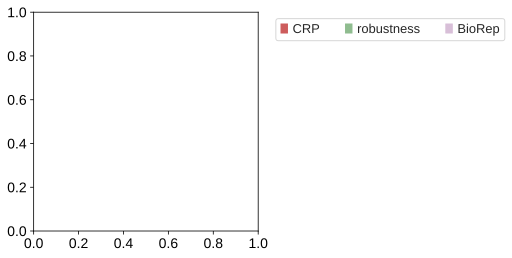

In [52]:
import matplotlib.patches as mpatches
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(trio, ['CRP', 'robustness', 'BioRep'])]

plt.legend(handles=patches, ncol=3, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
plt.savefig('./figures/mainfig_legend.svg')
plt.show()

In [53]:
def plot_sub(sub_df, cmap):
    sub_df = sub_df.loc[order]
    sub_df.columns = [c.split('_')[-1] for c in sub_df.columns]
    annot_df = sub_df.fillna(0)
    annot_df = annot_df.applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1"))
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        sub_df.round(3).rank(method='max'),
        annot=annot_df,
        cmap=cmap, linewidths=.5, fmt = '', cbar_kws={'label': 'Rank within column'}
    )
    plt.xticks(rotation=30, ha='right')
    plt.grid(None)
    plt.savefig(f'./figures/supp1_subres_{cmap}.svg')
    plt.show()
    
    bar_df = pd.DataFrame(sub_df.mean(axis=1))
    bar_df = add_type(bar_df)
    plt_bar(bar_df)
    plt.legend([], bbox_to_anchor=(1.01, 1.05))
    plt.ylim(.26)
    plt.savefig(f'./figures/supp1_subresbar_{cmap}.svg')
    plt.show()

    print(sub_df.mean())
    print('mean all:', sub_df.mean().mean())
    return sub_df

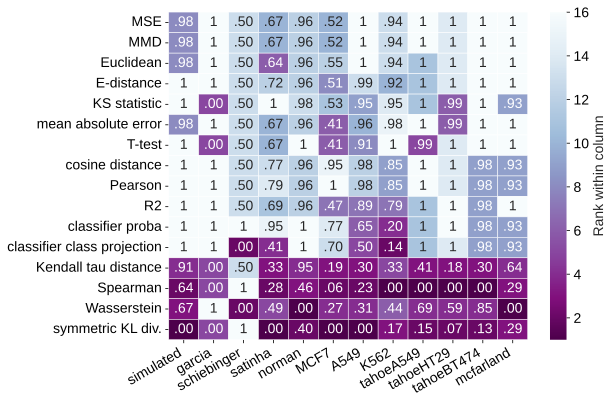

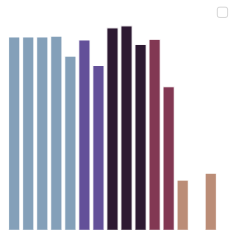

simulated      0.884091
garcia         0.687500
schiebinger    0.531250
satinha        0.608974
norman         0.844298
MCF7           0.491525
A549           0.728516
K562           0.652588
tahoeA549      0.826567
tahoeHT29      0.799507
tahoeBT474     0.823138
mcfarland      0.803571
dtype: float64
mean all: 0.7234605249585525


In [54]:
cols = [c for c in ndf.columns if 'sensitivity' in c]
sub_df = plot_sub(ndf[cols], 'BuPu_r')

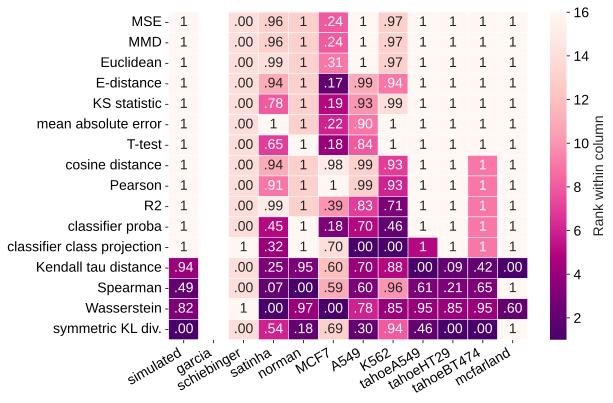

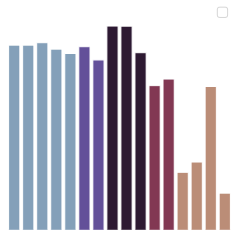

simulated      0.890806
garcia              NaN
schiebinger    0.125000
satinha        0.671436
norman         0.878944
MCF7           0.417916
A549           0.785149
K562           0.845436
tahoeA549      0.876367
tahoeHT29      0.821524
tahoeBT474     0.874785
mcfarland      0.912500
dtype: float64
mean all: 0.7363512289120774


In [55]:
cols = [c for c in ndf.columns if 'robustness' in c]
sub_df = plot_sub(ndf[cols], 'RdPu_r')

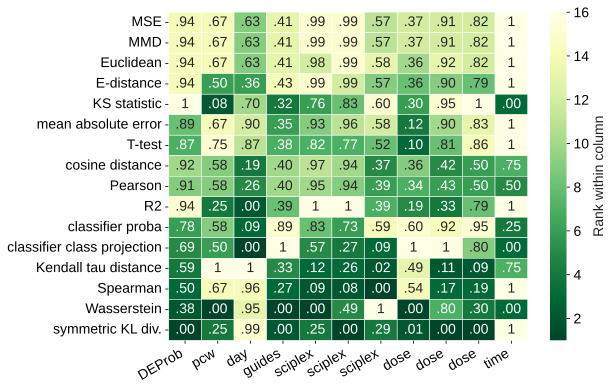

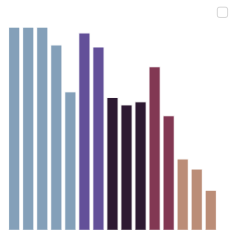

DEProb     0.763630
pcw        0.526042
day        0.572535
guides     0.399835
sciplex    0.702590
sciplex    0.702054
sciplex    0.446655
dose       0.344613
dose       0.655620
dose       0.627783
time       0.703125
dtype: float64
mean all: 0.5858621870488947


In [56]:
cols = [c for c in ndf.columns if 'sens' not in c and 'robu' not in c]
sub = ndf[cols]
sub.columns = ['_'.join(c.split('_')[:-1]) for c in sub.columns]
sub_df = plot_sub(sub, 'YlGn_r')

## spider plot

In [60]:
palette = {'Ia':'tab:blue','Ib':'tab:orange','II':'tab:green',
           'III':'tab:red','-':'tab:gray'}

wedge_dict = {
    'garcia':'Time course',
    'schiebinger':'Time course',
    'satinha':'CRISPR',
    'norman':'CRISPR',
    'MCF7':'Small molecule',
    'A549':'Small molecule',
    'K562':'Small molecule',
    'tahoeA549':'Small molecule',
    'tahoeBT474':'Small molecule',
    'tahoeHT29':'Small molecule',
    'mcfarland':'Small molecule',
    'simulated':'DE probability'
}

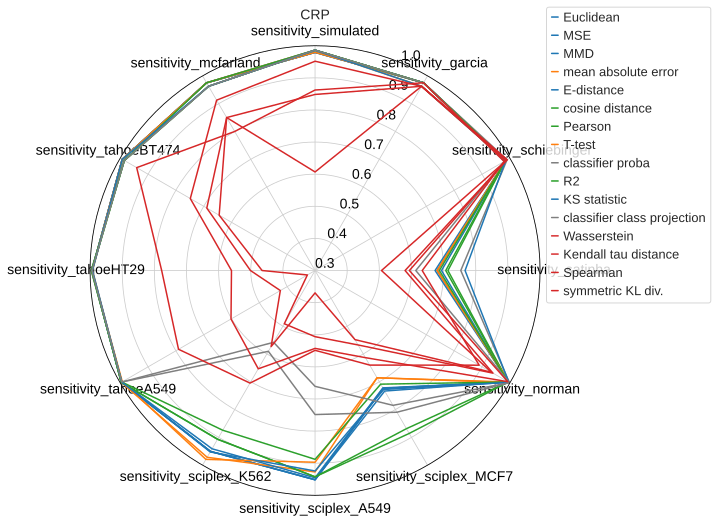

In [61]:
mdf = df[[col for col in df.columns if 'sensitivity' in col]]

labels = mdf.columns.tolist()
num_vars = len(labels)
angles = np.linspace(0, 2*np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(10,10), subplot_kw=dict(polar=True))

for idx, row in mdf.iterrows():
    values = row.tolist() + row.tolist()[:1]
    cat = types.get(idx, '-')
    ax.plot(angles, values, label=idx, color=palette[cat])

ax.set_theta_offset(np.pi/2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
ax.set_ylim(0.3, 1.0)
plt.legend(bbox_to_anchor=(1.0, 1.1))
plt.title('CRP')
plt.tight_layout()
plt.show()

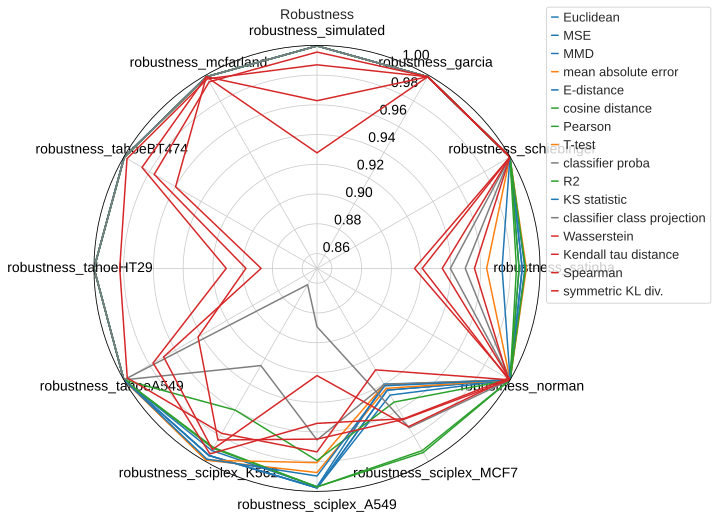

In [62]:
mdf = df[[col for col in df.columns if 'robustness' in col]]

labels = mdf.columns.tolist()
num_vars = len(labels)
angles = np.linspace(0, 2*np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(10,10), subplot_kw=dict(polar=True))

for idx, row in mdf.iterrows():
    values = row.tolist() + row.tolist()[:1]
    cat = types.get(idx, '-')
    ax.plot(angles, values, label=idx, color=palette[cat])

ax.set_theta_offset(np.pi/2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
ax.set_ylim(0.85, 1.0)
plt.legend(bbox_to_anchor=(1.0, 1.1))
plt.title('Robustness')
plt.tight_layout()
plt.show()

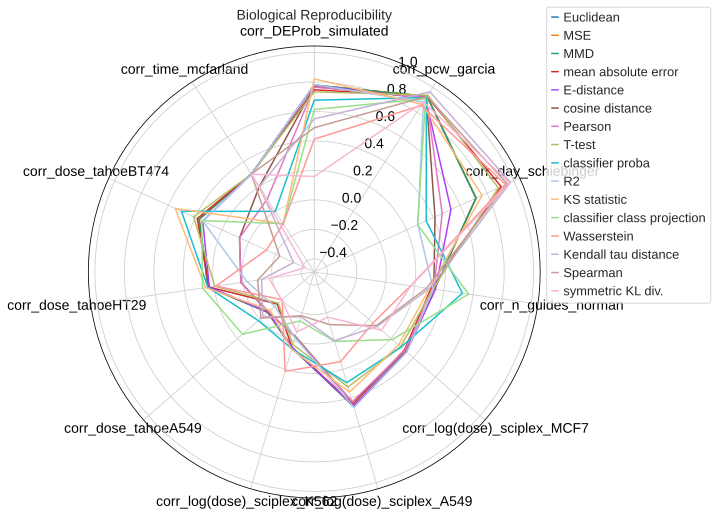

In [63]:
mdf = df[[col for col in df.columns if 'corr' in col]]

labels = mdf.columns.tolist()
num_vars = len(labels)
angles = np.linspace(0, 2*np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(10,10), subplot_kw=dict(polar=True))

for idx, row in mdf.iterrows():
    values = row.tolist() + row.tolist()[:1]
    ax.plot(angles, values, label=idx)

ax.set_theta_offset(np.pi/2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
# ax.set_ylim(0.85, 1.0)
plt.legend(bbox_to_anchor=(1.0, 1.1))
plt.title('Biological Reproducibility')
plt.tight_layout()
plt.show()

## cluster metrics based on performance

In [64]:
import anndata as ad

In [65]:
types = {
    'E-distance':'ia',
    'Euclidean':'ia',
    'KS statistic':'ia',
    'Kendall tau distance':'iii',
    'MMD':'ia',
    'MSE':'ia',
    'Pearson':'ii',
    'R2':'ii',
    'cosine distance':'ii',
#     'classifier proba':'-',
    'Spearman':'iii',
    'T-test':'ib',
    'Wasserstein':'iii',
#     'classifier class projection':'-',
    'mean absolute error':'ib',
    'symmetric KL div.':'iii',
}

In [66]:
perf = ad.AnnData(main_plot_df)
perf.obs['method'] = main_plot_df.index.astype('category')
perf.obs['type'] = perf.obs.method.map(types)
perf

AnnData object with n_obs × n_vars = 16 × 35
    obs: 'method', 'type'

In [67]:
sc.tl.pca(perf)
perf.obsm['X_pca'][:, 0] += np.random.normal(0, 0.01, perf.shape[0])  # Add jitter to the first component
perf.obsm['X_pca'][:, 1] += np.random.normal(0, 0.01, perf.shape[0])  # Add jitter to the second component

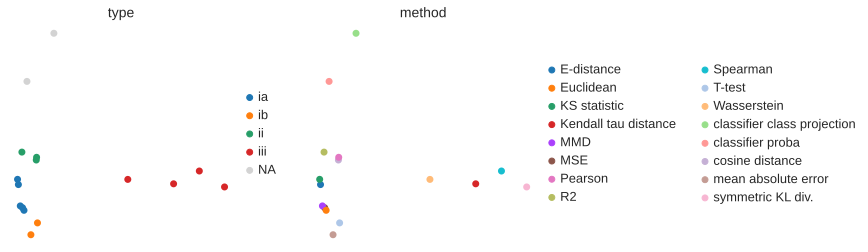

In [68]:
sc.pl.pca(perf, color=['type', 'method'], size=200, show=False)
plt.savefig('./figures/metric_pca.svg')